In [23]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import ast


In [24]:
PROJECT_ROOT = Path.cwd().parent

DATA_PROCESSED = PROJECT_ROOT / "data" / "processed"

DATA_SYMBOLIC = PROJECT_ROOT / "data" / "symbolic"
DATA_SYMBOLIC.mkdir(parents=True, exist_ok=True)

DATA_CLUSTER = PROJECT_ROOT / "data" / "cluster"
DATA_CLUSTER.mkdir(parents=True, exist_ok=True)

print("Processed data folder:", DATA_CLUSTER)

Processed data folder: c:\Users\ccana\Documents\Doutorado\VISEMTracking\data\cluster


In [25]:
df = pd.read_csv(DATA_SYMBOLIC / "01_symbolic.csv")
df_symbolic_per_trajectory = pd.read_csv(DATA_SYMBOLIC / "02_symbolic_per_trajectory.csv")

In [26]:
df_symbolic_per_trajectory["symbolic_movement"] = (
    df_symbolic_per_trajectory["symbolic_movement"]
    .apply(ast.literal_eval)
)


In [27]:
symbols = sorted(
    s for s in df["symbol"].unique()
    if isinstance(s, str) and s.strip() != ""
)

sym2idx = {s: i for i, s in enumerate(symbols)}
idx2sym = {i: s for s, i in sym2idx.items()}

print("Número de símbolos:", len(symbols))
print("Símbolos:", symbols)


Número de símbolos: 18
Símbolos: ['Lento_Leste', 'Lento_Norte', 'Lento_Oeste', 'Lento_Sul', 'Medio_Leste', 'Medio_Norte', 'Medio_Oeste', 'Medio_Sul', 'Muito_Lento_Leste', 'Muito_Lento_Norte', 'Muito_Rapido_Leste', 'Muito_Rapido_Norte', 'Muito_Rapido_Oeste', 'Muito_Rapido_Sul', 'Rapido_Leste', 'Rapido_Norte', 'Rapido_Oeste', 'Rapido_Sul']


In [28]:
def markov_transition_matrix_1st_order(sequence, sym2idx):
    n = len(sym2idx)
    M = np.zeros((n, n), dtype=float)

    seq = [
        s for s in sequence
        if isinstance(s, str) and s.strip() != ""
    ]

    if len(seq) < 2:
        return M

    for s1, s2 in zip(seq[:-1], seq[1:]):
        i = sym2idx[s1]
        j = sym2idx[s2]
        M[i, j] += 1.0

    row_sum = M.sum(axis=1, keepdims=True)
    row_sum[row_sum == 0] = 1.0

    return M / row_sum


In [29]:
markov_matrices = {}

for _, row in df_symbolic_per_trajectory.iterrows():
    traj_id = row["trajectory_id"]
    seq = row["symbolic_movement"]

    M = markov_transition_matrix_1st_order(seq, sym2idx)
    markov_matrices[traj_id] = M


In [30]:
M_global = np.mean(
    np.stack(list(markov_matrices.values())),
    axis=0
)

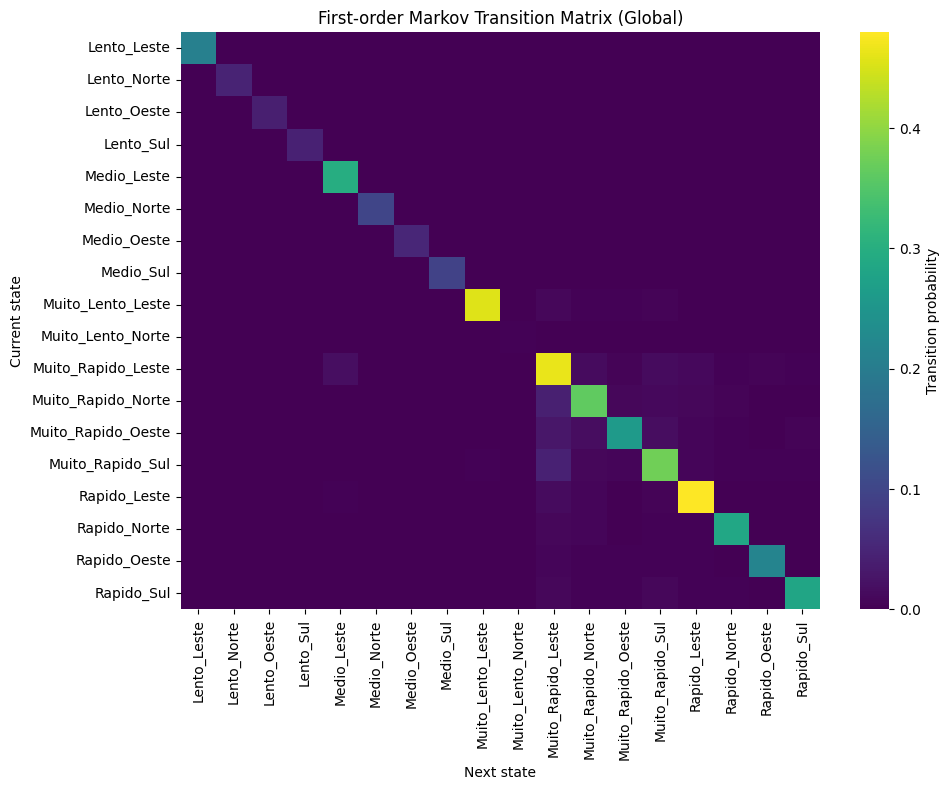

In [31]:
plt.figure(figsize=(10, 8))

sns.heatmap(
    M_global,
    xticklabels=symbols,
    yticklabels=symbols,
    cmap="viridis",
    annot=False,
    cbar_kws={"label": "Transition probability"}
)

plt.title("First-order Markov Transition Matrix (Global)")
plt.xlabel("Next state")
plt.ylabel("Current state")
plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()


In [32]:
transition_vectors = []

for seq in df_symbolic_per_trajectory["symbolic_movement"]:
    P = markov_transition_matrix_1st_order(seq, sym2idx)
    transition_vectors.append(P.flatten())

df_markov = pd.DataFrame(transition_vectors)
df_markov["trajectory_id"] = df_symbolic_per_trajectory["trajectory_id"]

df_markov.head()


,0,1,2,3,4,5,6,7,8,9,...,315,316,317,318,319,320,321,322,323,trajectory_id
0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,ckyw6zzlj001r3867thf0fuy7
1,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.5,0.000000,0.0,0.0,0.500000,ckyw704kw001v3867kvyjtx6k
2,0.995536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,ckyw708pn001z386779fr849h
3,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,ckyw7dzmx00273867fyj9lsnv
4,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.033333,0.0,0.0,0.933333,ckyw7e4o6002b3867ibaukox2


In [33]:
from sklearn.cluster import AgglomerativeClustering

X = df_markov.drop(columns=["trajectory_id"]).values

n_clusters = 10   # ajuste se quiser

clustering = AgglomerativeClustering(n_clusters=n_clusters)
cluster_ids = clustering.fit_predict(X)

df_markov["cluster_markov"] = cluster_ids

symbolic_markov = df_symbolic_per_trajectory.copy()
symbolic_markov["cluster_markov"] = cluster_ids

symbolic_markov.head()

,trajectory_id,symbolic_movement,cluster_markov
0,ckyw6zzlj001r3867thf0fuy7,"[, Muito_Rapido_Leste, Muito_Rapido_Leste, Mui...",3
1,ckyw704kw001v3867kvyjtx6k,"[, Muito_Rapido_Oeste, Muito_Rapido_Oeste, Mui...",3
2,ckyw708pn001z386779fr849h,"[, Rapido_Leste, Rapido_Leste, Rapido_Leste, R...",4
3,ckyw7dzmx00273867fyj9lsnv,"[, Muito_Rapido_Norte, Muito_Rapido_Norte, Mui...",3
4,ckyw7e4o6002b3867ibaukox2,"[, Rapido_Norte, Rapido_Norte, Rapido_Norte, R...",5


In [34]:
import ast
import numpy as np
import matplotlib.pyplot as plt

# ========================================================
# Sequências simbólicas por trajetória (JÁ PRONTAS)
# ========================================================

# 🔁 MUDE AQUI se o nome da coluna for outro
SEQ_COL = "symbolic_movement"  # ex: "symbolic_movement"

state_sequences = df_symbolic_per_trajectory[["trajectory_id", SEQ_COL]].copy()

# Garantia: converter string → lista, se vier do CSV
if isinstance(state_sequences.loc[0, SEQ_COL], str):
    state_sequences[SEQ_COL] = state_sequences[SEQ_COL].apply(ast.literal_eval)

# ========================================================
# Tratar elementos vazios ou nulos
# ========================================================
for i, seq in enumerate(state_sequences[SEQ_COL]):
    state_sequences.at[i, SEQ_COL] = [s if s != '' else 'NA' for s in seq]

# ========================================================
# Mapear símbolos para índices inteiros para o colormap
# ========================================================
# Extrair todos os símbolos únicos
all_symbols = np.unique(np.concatenate(state_sequences[SEQ_COL].values))

# Criar dicionário: símbolo -> índice
symbol_to_idx = {s: i for i, s in enumerate(all_symbols)}

# Colormap
cmap = plt.get_cmap("tab20", len(all_symbols))

# ========================================================
# Juntar com cluster de Markov e ordenar
# ========================================================
state_sequences = (
    state_sequences
    .merge(
        symbolic_markov[["trajectory_id", "cluster_markov"]],
        on="trajectory_id",
        how="left"
    )
    .sort_values("cluster_markov")
    .reset_index(drop=True)
)

# ========================================================
# Construção da imagem (Behaviour Rugs)
# ========================================================
max_len = state_sequences[SEQ_COL].apply(len).max()
img = np.zeros((len(state_sequences), max_len, 3))

for i, seq in enumerate(state_sequences[SEQ_COL]):
    row_colors = [cmap(symbol_to_idx[s])[:3] for s in seq]
    row_colors += [[0, 0, 0]] * (max_len - len(row_colors))
    img[i] = row_colors

# ========================================================
# Plot Behaviour Rugs
# ========================================================
fig, ax = plt.subplots(figsize=(14, 0.5 * len(state_sequences)))

ax.imshow(img, aspect="auto", interpolation="nearest")

ax.set_yticks(range(len(state_sequences)))
ax.set_yticklabels(
    state_sequences["trajectory_id"].astype(str) +
    " (MK:" + state_sequences["cluster_markov"].astype(str) + ")"
)

ax.set_xlabel("Time")
ax.set_ylabel("Trajectory (Markov Cluster)")
ax.set_title("Behaviour Rugs – Sequências Simbólicas")

plt.tight_layout()
plt.show()


In [35]:
DATA_SYMBOLIC = PROJECT_ROOT / "data" / "symbolic"
df_processed = pd.read_csv(DATA_SYMBOLIC / "01_symbolic.csv")

In [36]:
symbolic_markov.columns

Index(['trajectory_id', 'symbolic_movement', 'cluster_markov'], dtype='object')

Clusters encontrados: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


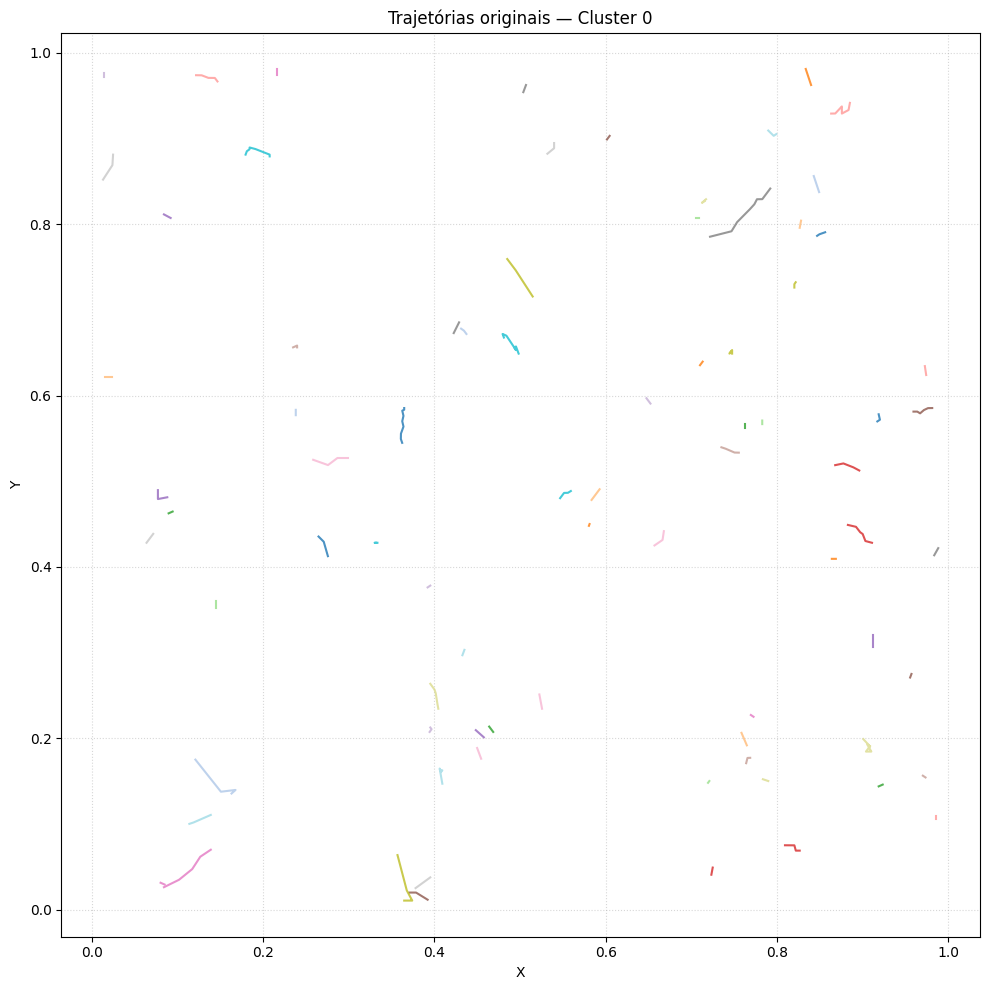

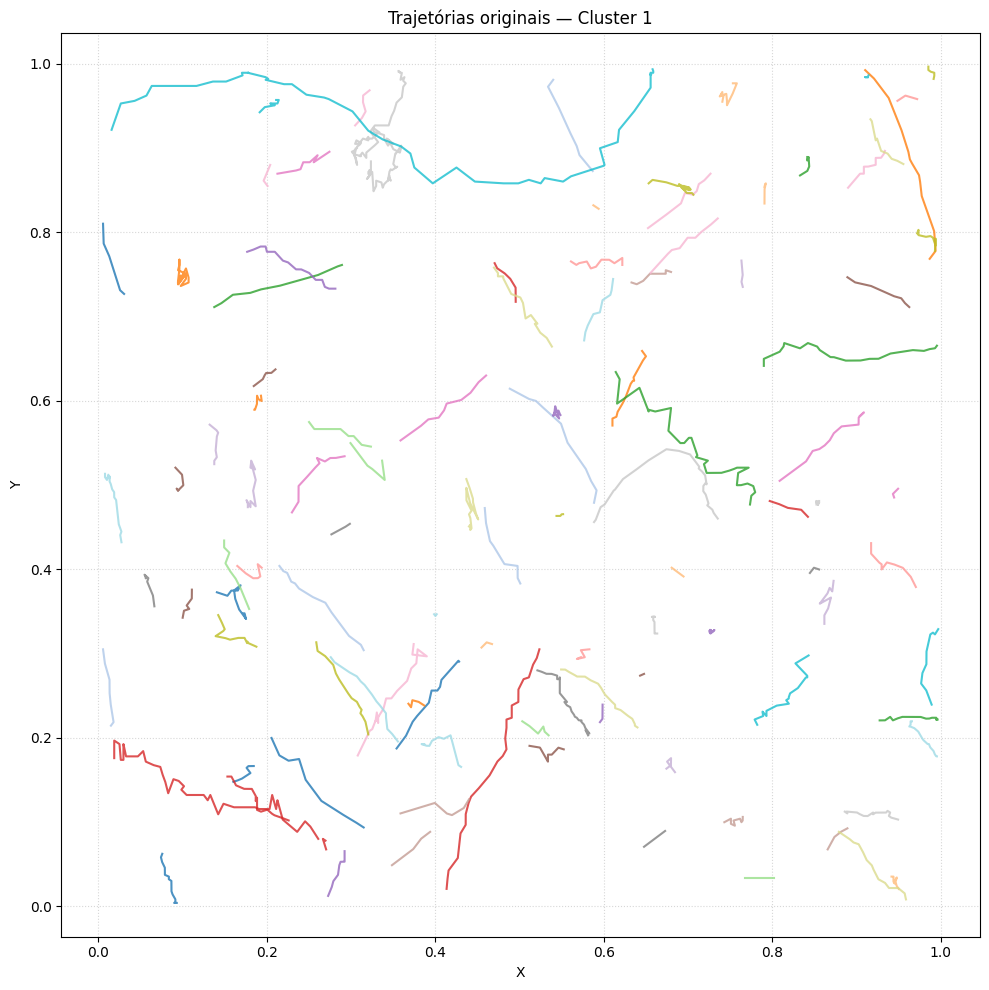

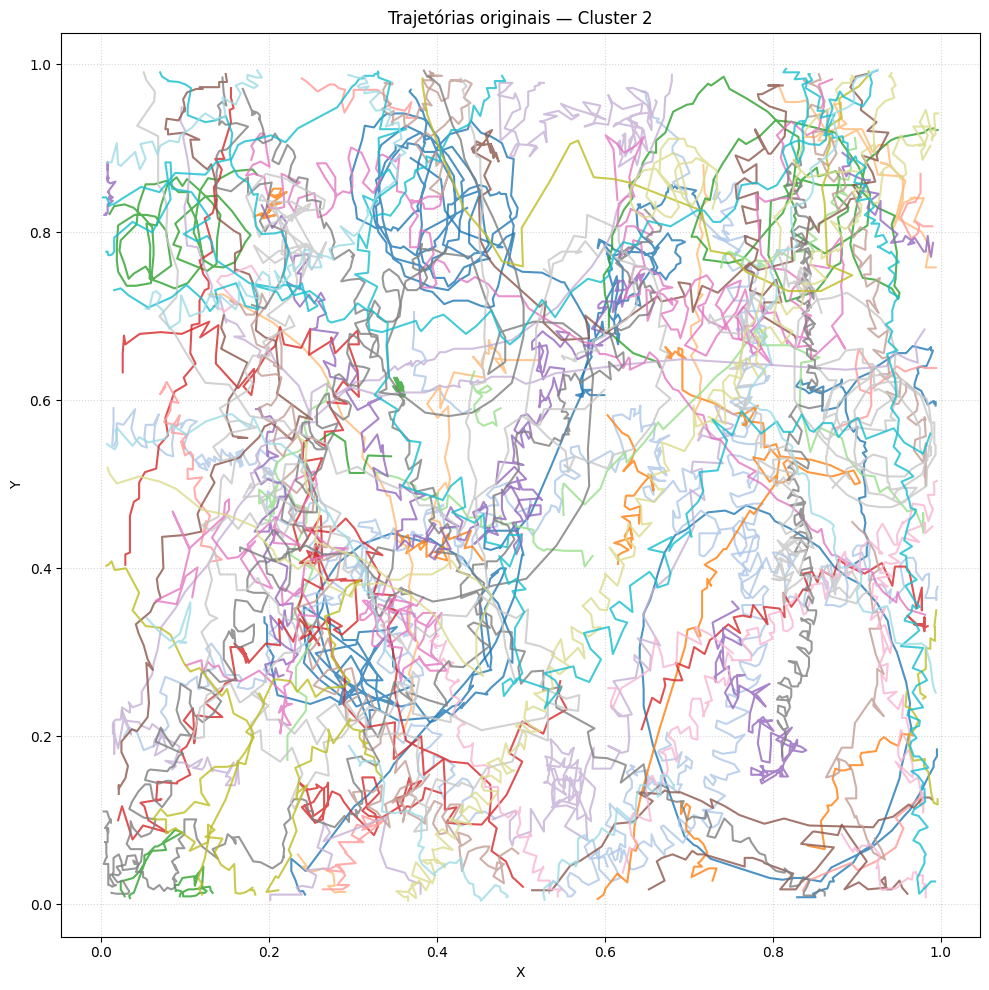

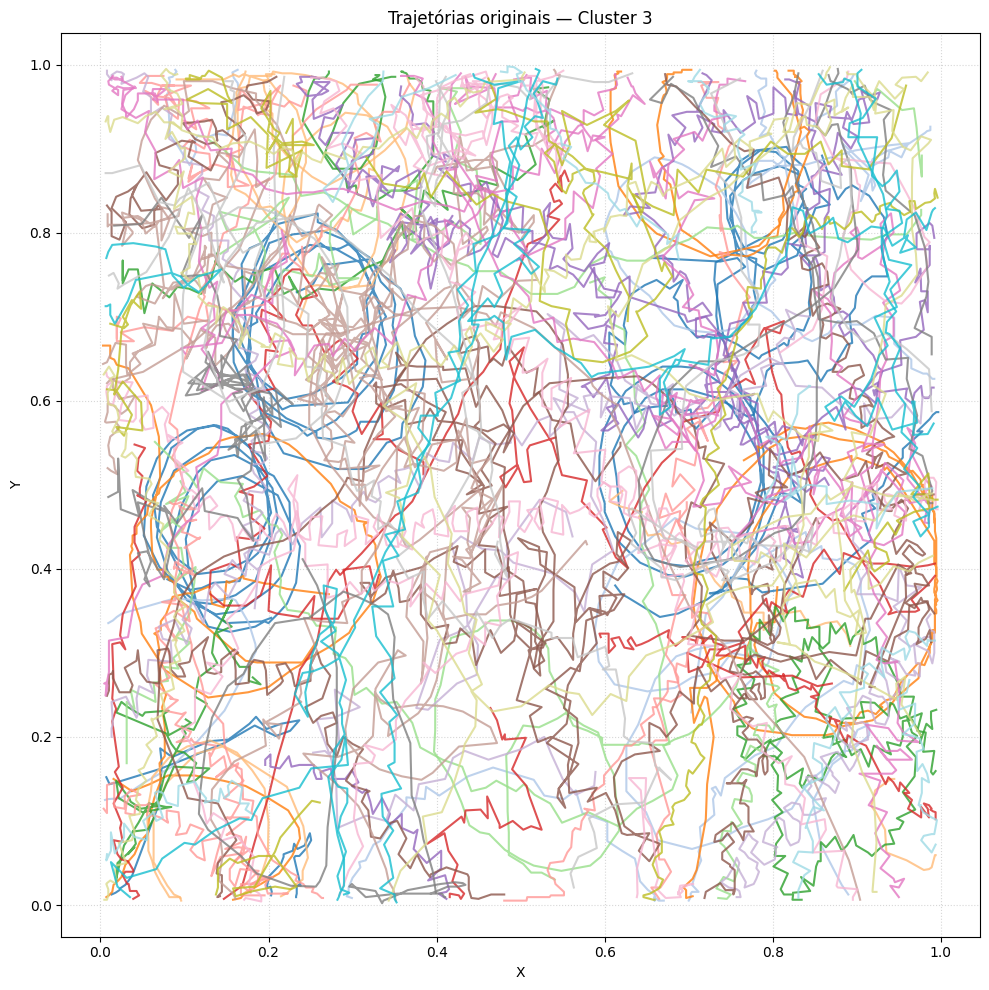

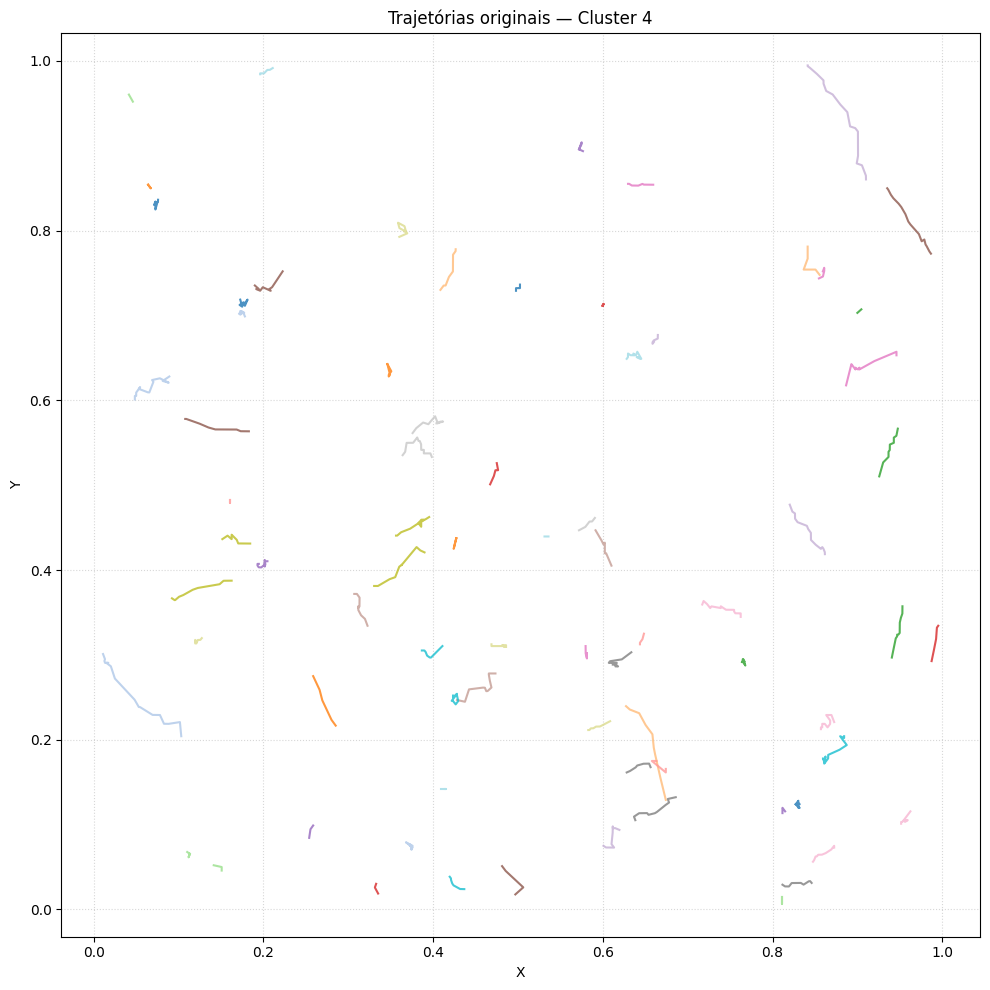

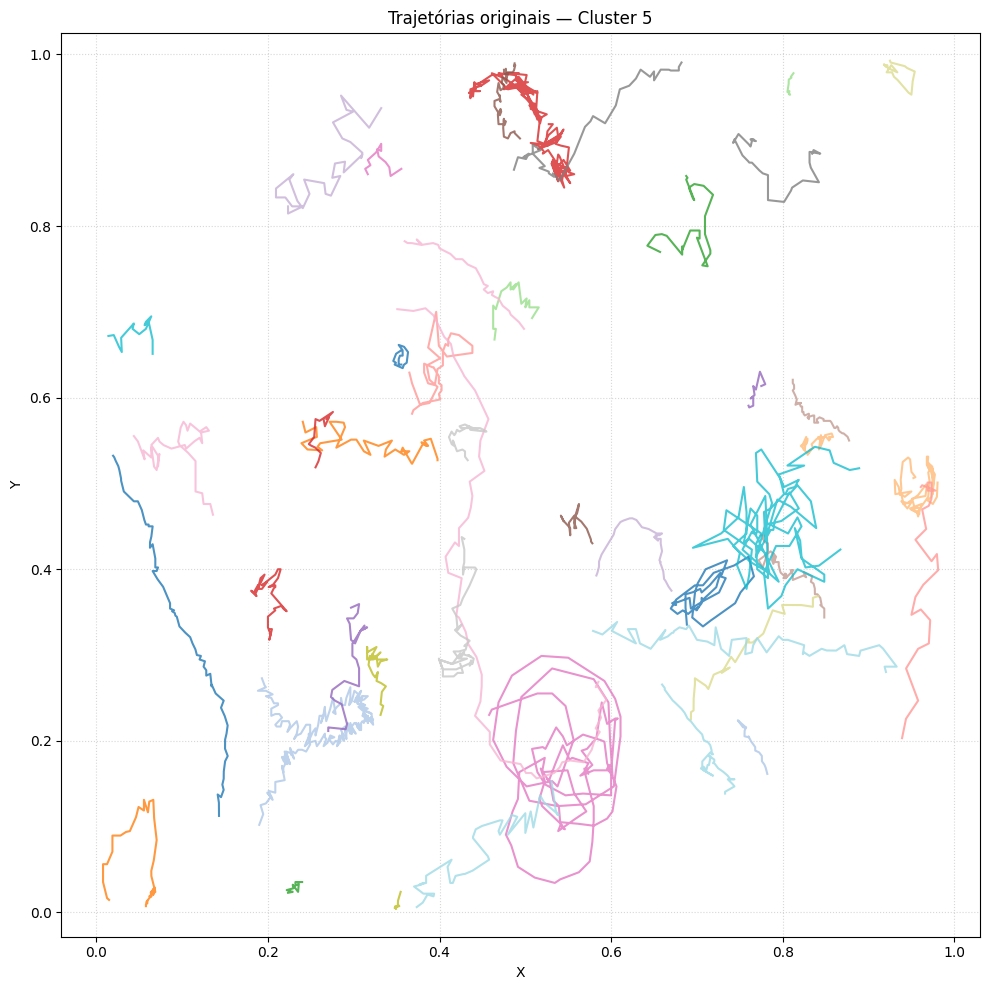

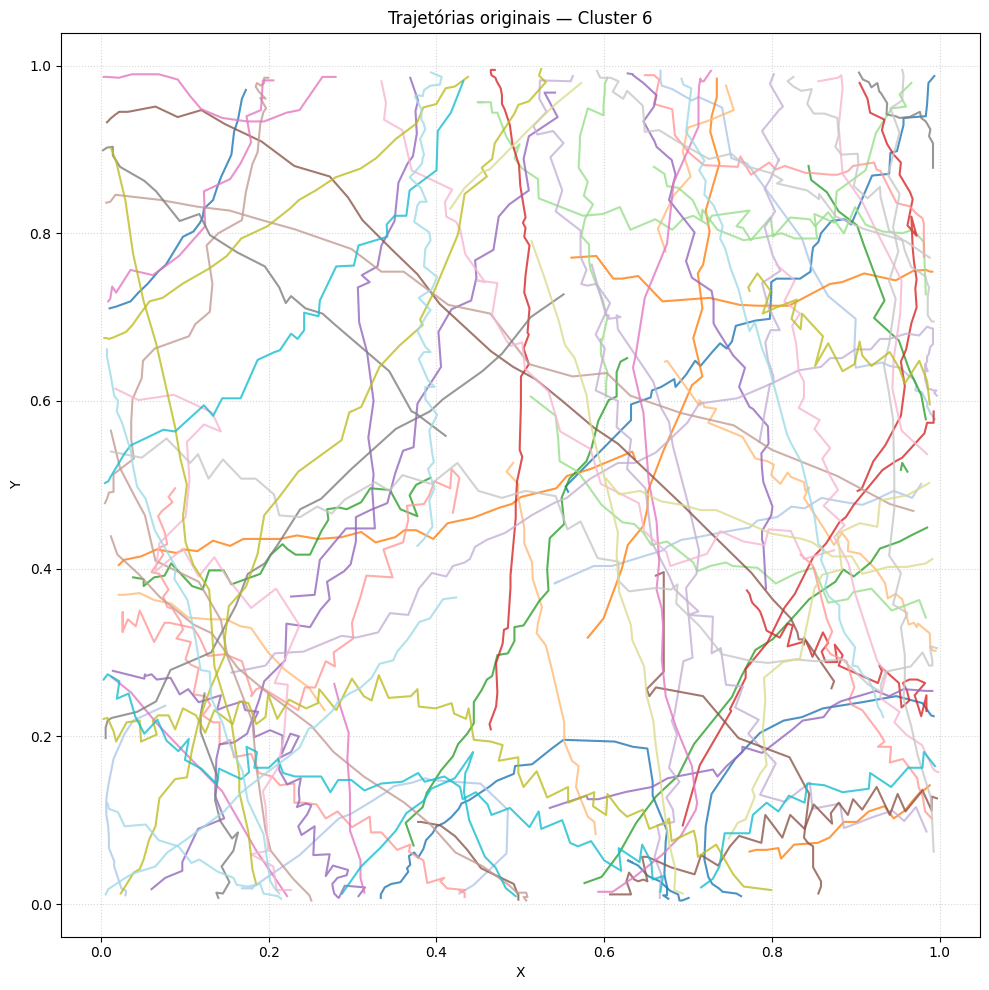

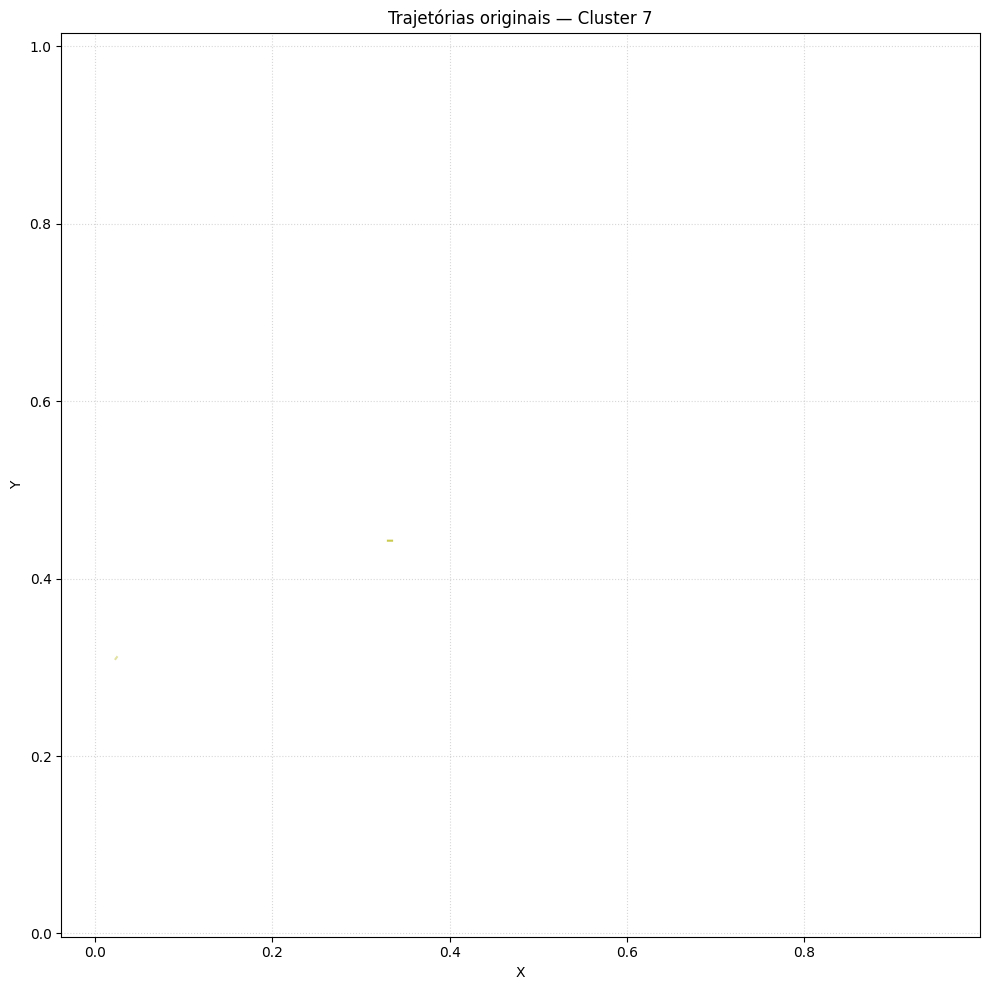

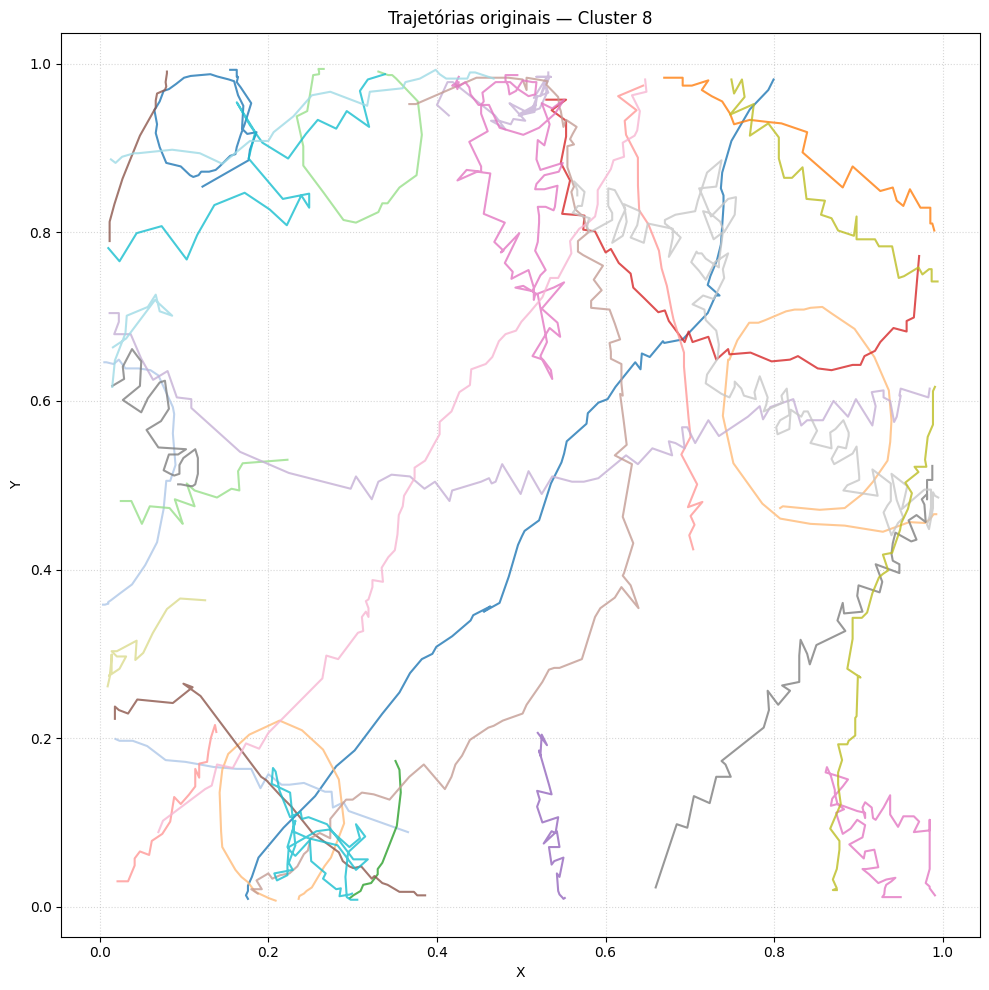

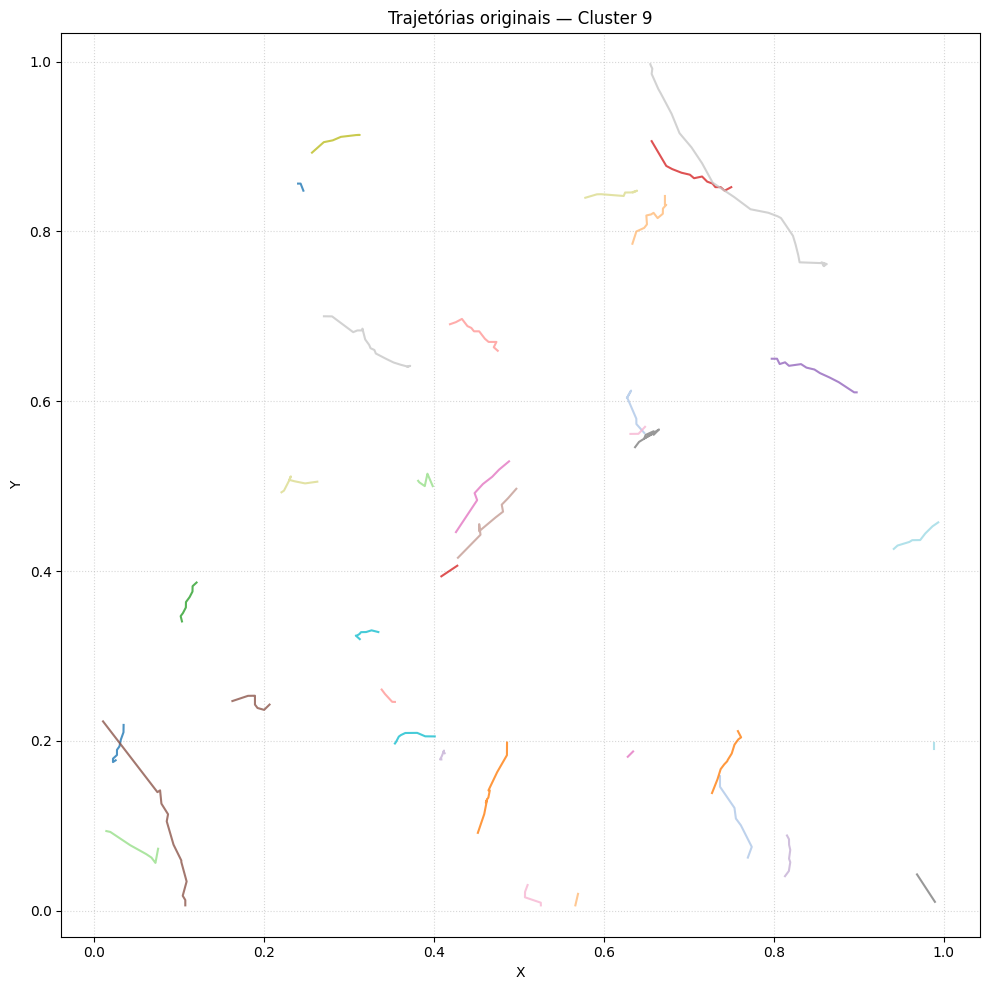

In [37]:

# -------------------------------------------------
# Descobrir clusters existentes
# -------------------------------------------------
clusters = sorted(symbolic_markov["cluster_markov"].dropna().unique())

print("Clusters encontrados:", clusters)

# -------------------------------------------------
# Loop por cluster
# -------------------------------------------------
for cluster_id in clusters:

    # 1. Trajectory_ids do cluster atual
    traj_cluster = symbolic_markov.loc[
        symbolic_markov["cluster_markov"] == cluster_id,
        "trajectory_id"
    ].unique()

    # 2. Filtrar df_processed
    df_processed_cluster = df_processed[
        df_processed["trajectory_id"].isin(traj_cluster)
    ].copy()

    # Segurança: pular clusters vazios
    if df_processed_cluster.empty:
        print(f"Cluster {cluster_id} vazio. Pulando...")
        continue

    # -------------------------------------------------
    # 3. Plotar trajetórias do cluster
    # -------------------------------------------------
    plt.figure(figsize=(10, 10))

    grouped = df_processed_cluster.groupby("trajectory_id")
    colors = plt.cm.tab20(np.linspace(0, 1, len(grouped)))

    for color, (traj_id, g) in zip(colors, grouped):
        g = g.sort_values("timestamp")
        plt.plot(g["x"], g["y"], color=color, alpha=0.8)

    plt.title(f"Trajetórias originais — Cluster {cluster_id}")
    plt.xlabel("X")
    plt.ylabel("Y")

    plt.axis("equal")
    plt.grid(True, linestyle=":", alpha=0.5)
    plt.tight_layout()
    plt.show()
    plt.close()
